# Celltype - consensus time group specific markers in WT ground tissue

#### Working directory must contain subdirectories,supp_data

#### supp_data/ should contain the file:

    Ground_Tissue_Atlas.rds (get it by running through notebook 8, 9 & 10)
    features.tsv.gz

In [1]:
rm(list=ls())
# Set the working directory to where folders named after the samples are located. 
# The folder contains spliced.mtx, unspliced.mtx, barcodes and gene id files, and json files produced by scKB that documents the sequencing stats. 
setwd("/scratch/AG_Ohler/CheWei/scKB")

In [2]:
library(tidyverse)
library(Seurat)
library(RColorBrewer)
library(future)
library(cowplot)
library(ComplexHeatmap)
library(circlize)
library(ggrepel)
#for 200gb ram 
options(future.globals.maxSize = 200000 * 1024^2)

── Attaching packages ────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.0 ──

✔ ggplot2 3.3.2     ✔ purrr   0.3.4
✔ tibble  3.0.4     ✔ dplyr   1.0.2
✔ tidyr   1.1.2     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.0

── Conflicts ───────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Loading required package: grid

ComplexHeatmap version 2.6.2
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

This message can be suppressed by:
  suppressPackageSt

In [3]:
rc.integrated <- readRDS("./supp_data/Ground_Tissue_Atlas.rds")

In [4]:
table(rc.integrated$celltype.anno)


           Quiescent Center                   Columella 
                        158                           0 
           Lateral Root Cap                Atrichoblast 
                          0                           0 
                Trichoblast                      Cortex 
                          0                       11073 
                 Endodermis Metaphloem & Companion Cell 
                      11369                           0 
                Protophloem                  Procambium 
                          0                           0 
       Xylem Pole Pericycle       Phloem Pole Pericycle 
                          0                           0 
                 Protoxylem                   Metaxylem 
                          0                           0 

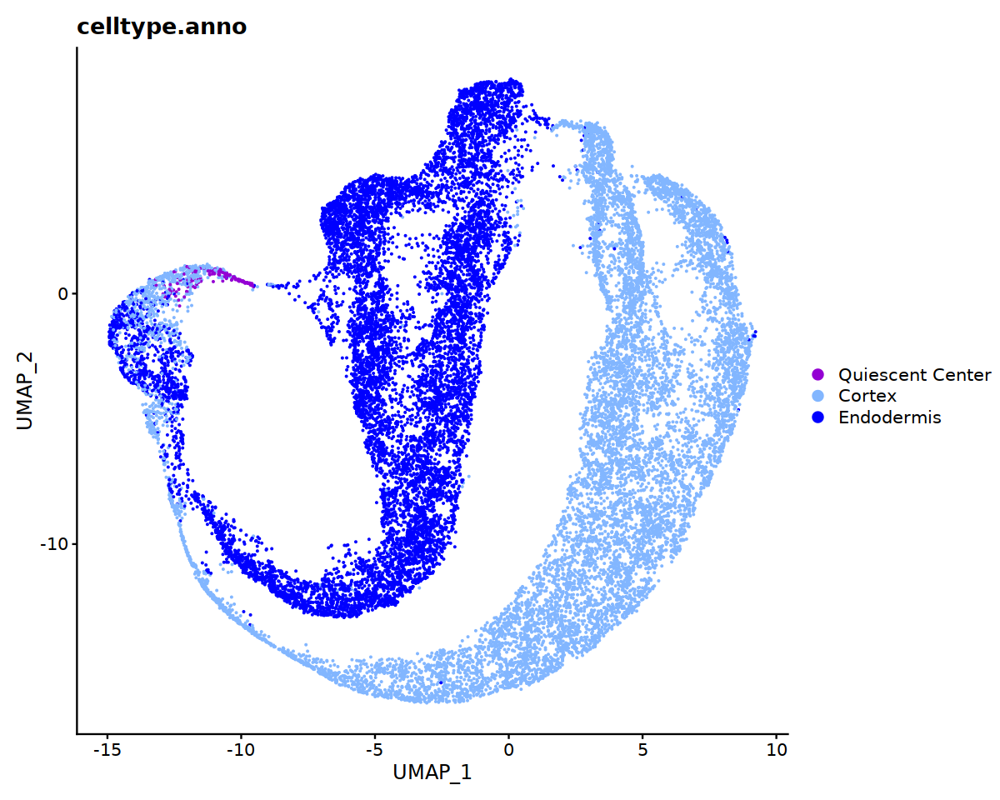

In [10]:
# Plot celltype annotation
order <- c("Quiescent Center", "Ground Tissue","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Metaphloem & Companion Cell","Protophloem", "Xylem", "Procambium","Xylem Pole Pericycle","Phloem Pole Pericycle", "Protoxylem", "Metaxylem", "Unknown")
palette <- c("#9400d3", "#DCD0FF","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#dd77ec", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f", "#EEEEEE")
rc.integrated$celltype.anno <- factor(rc.integrated$celltype.anno, levels = order[sort(match(unique(rc.integrated$celltype.anno),order))]) 
color <- palette[sort(match(unique(rc.integrated$celltype.anno),order))]
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(rc.integrated, reduction = "umap", group.by = "celltype.anno", cols = color)+ggtitle("celltype.anno")

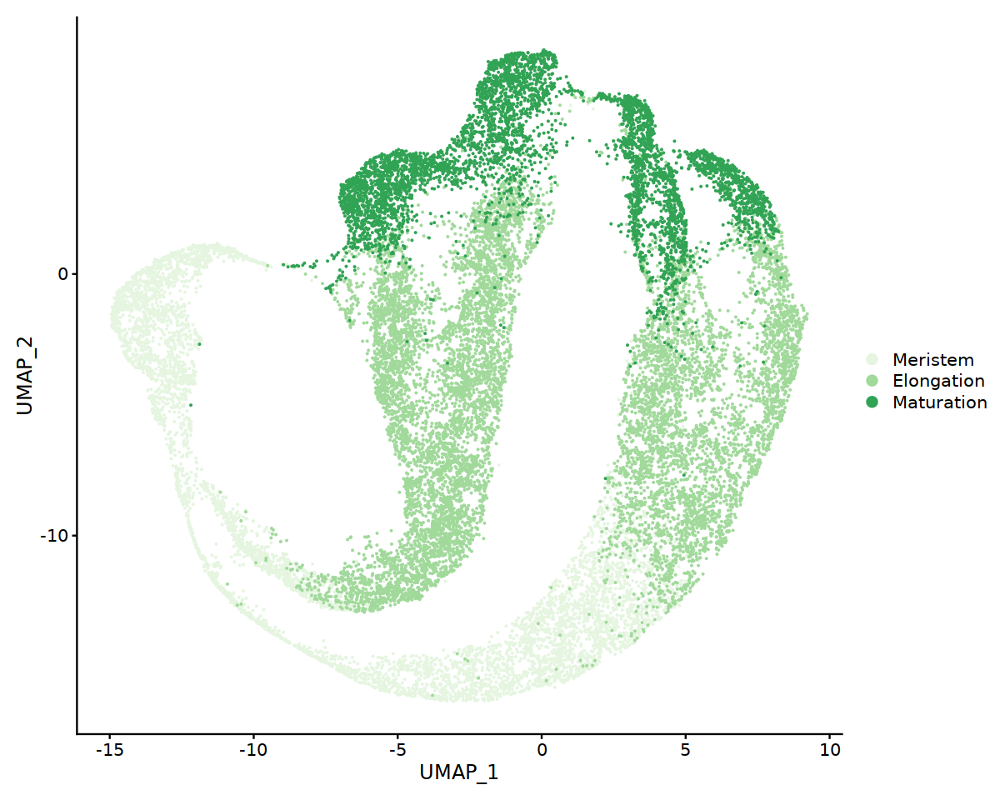

In [11]:
# Plot time
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(rc.integrated, reduction = "umap", group.by = "time.anno",order = c("Distal Columella","Proximal Columella","Distal Lateral Root Cap","Proximal Lateral Root Cap","Maturation","Elongation","Meristem"),cols = c("#e5f5e0", "#a1d99b", "#31a354", "#deebf7", "#3182bd", '#fee0d2','#de2d26'))

In [12]:
table(rc.integrated$consensus.time.group)


  T0   T1   T2   T3   T4   T5   T6   T7   T8   T9 
1278  808 1815 2840 2718 2574 2351 2041 3023 3152 

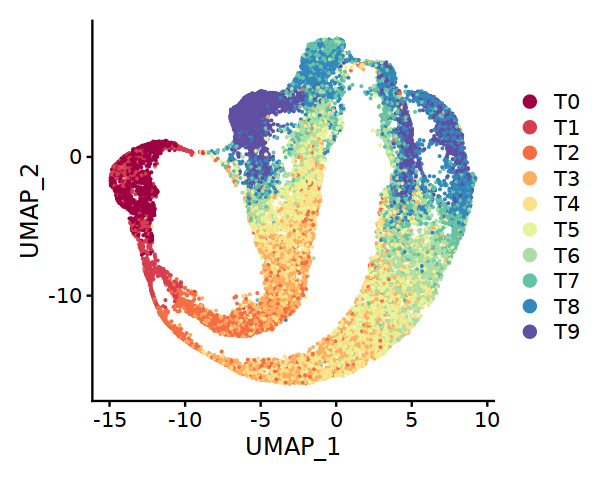

In [200]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(rc.integrated, reduction = "umap", group.by = "consensus.time.group", cols=brewer.pal(10,"Spectral"))

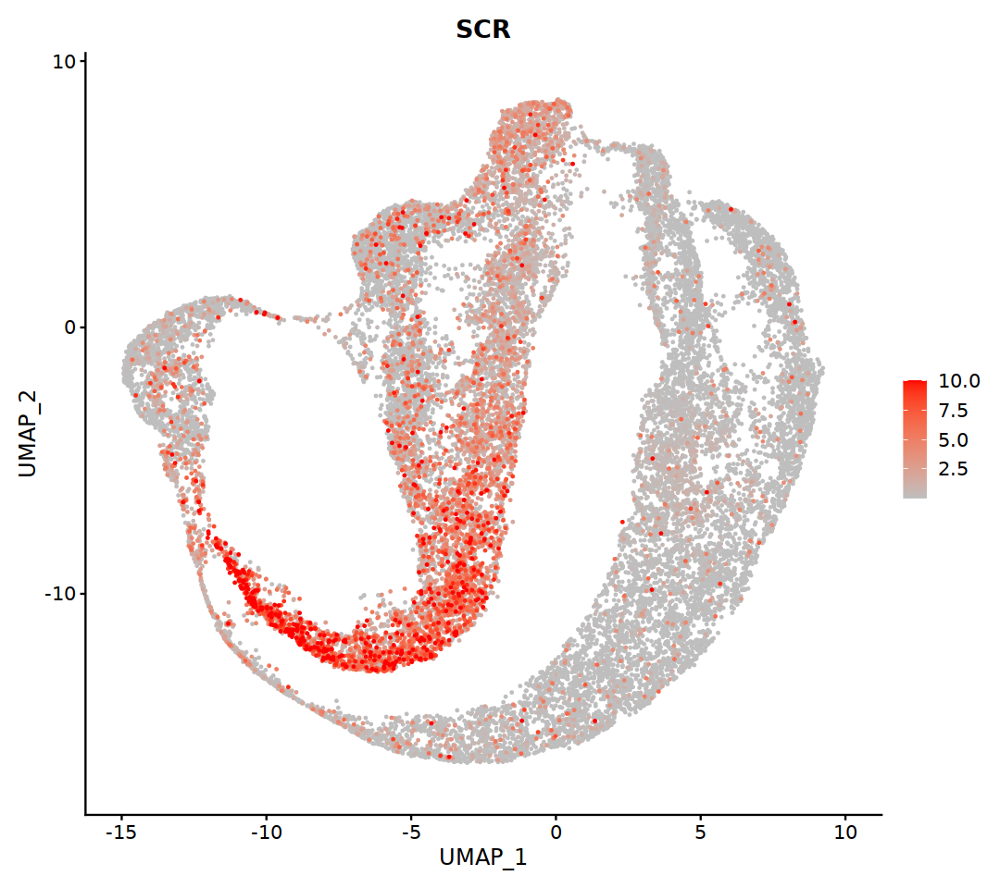

In [18]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

(SCR <- FeaturePlot(rc.integrated, features = "AT3G54220",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("SCR"))

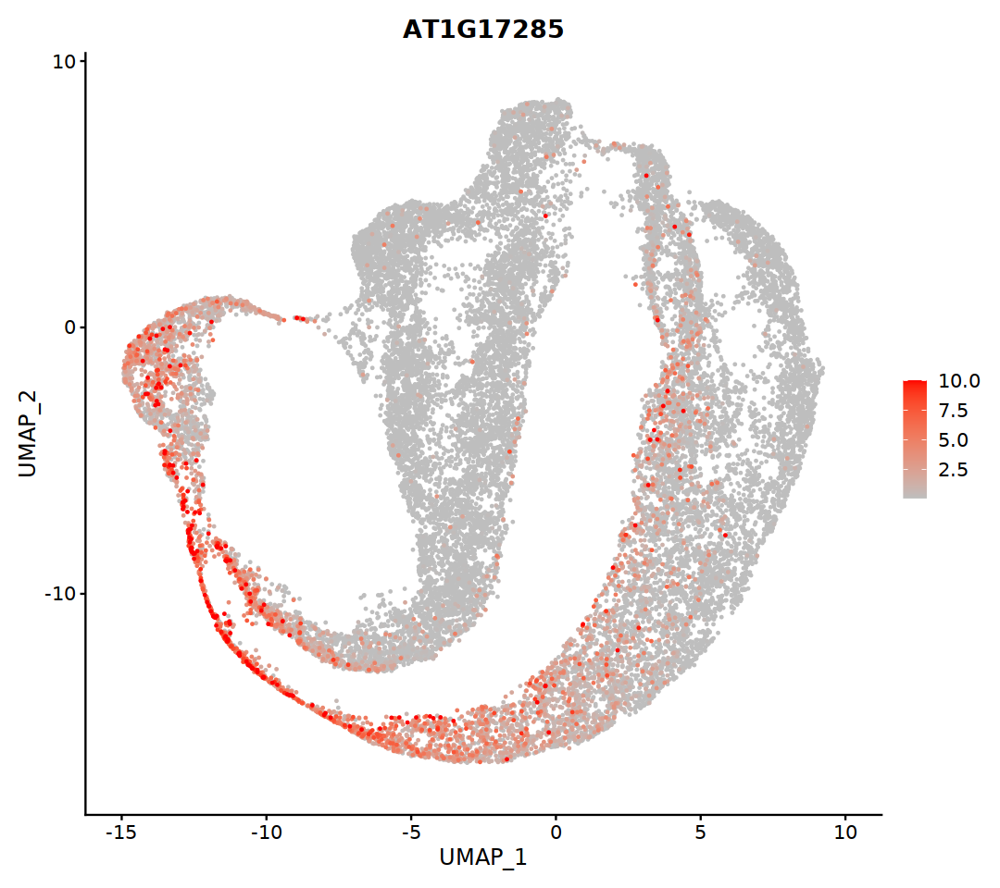

In [196]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT1G17285",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("AT1G17285")

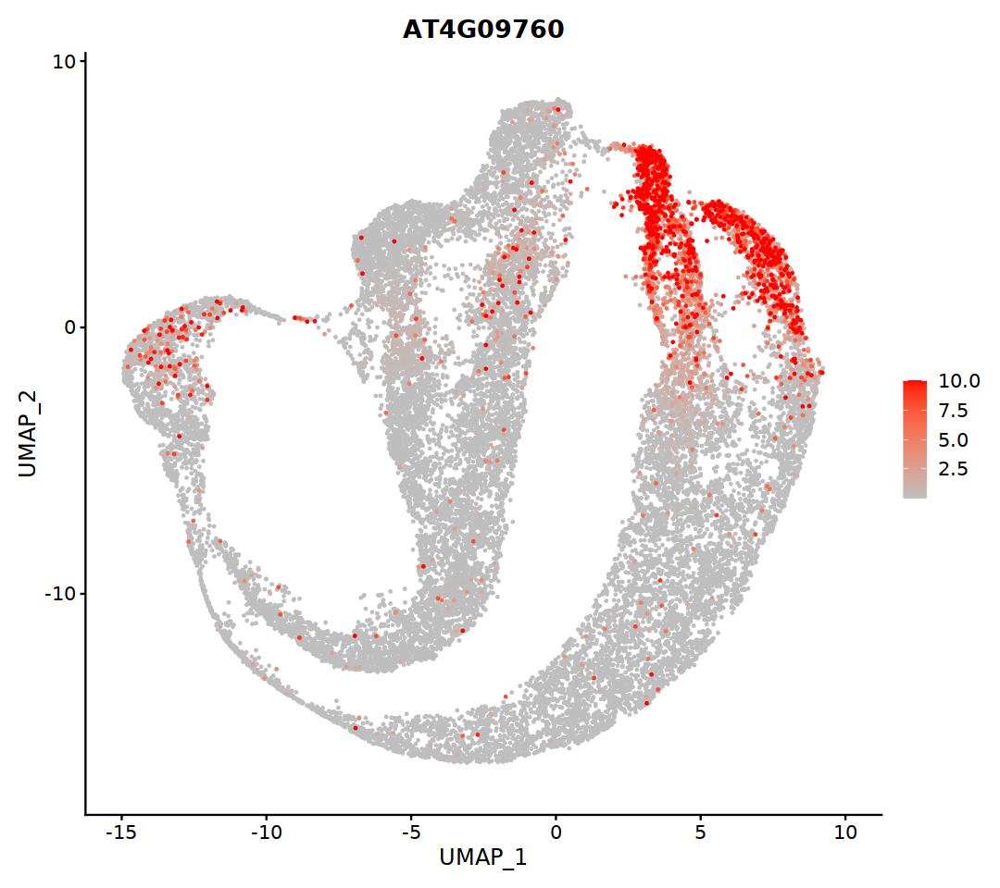

In [197]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT4G09760",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("AT4G09760")

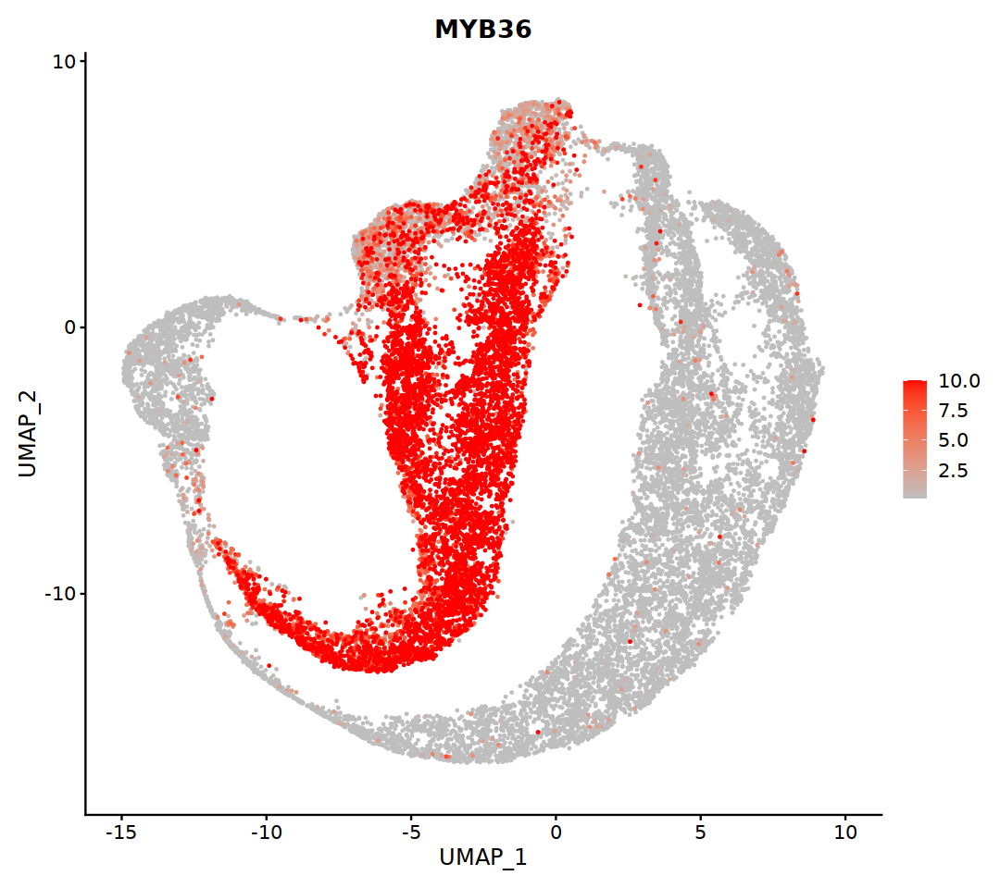

In [19]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT5G57620",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("MYB36")

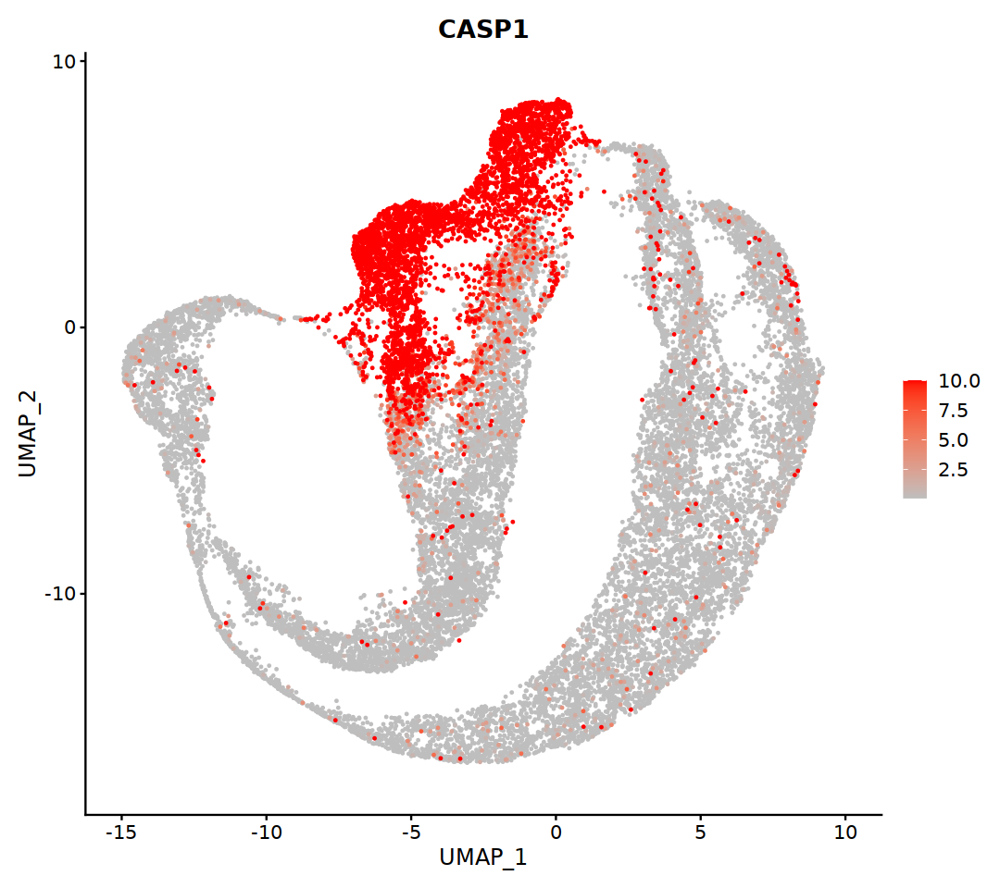

In [20]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT2G36100",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("CASP1")

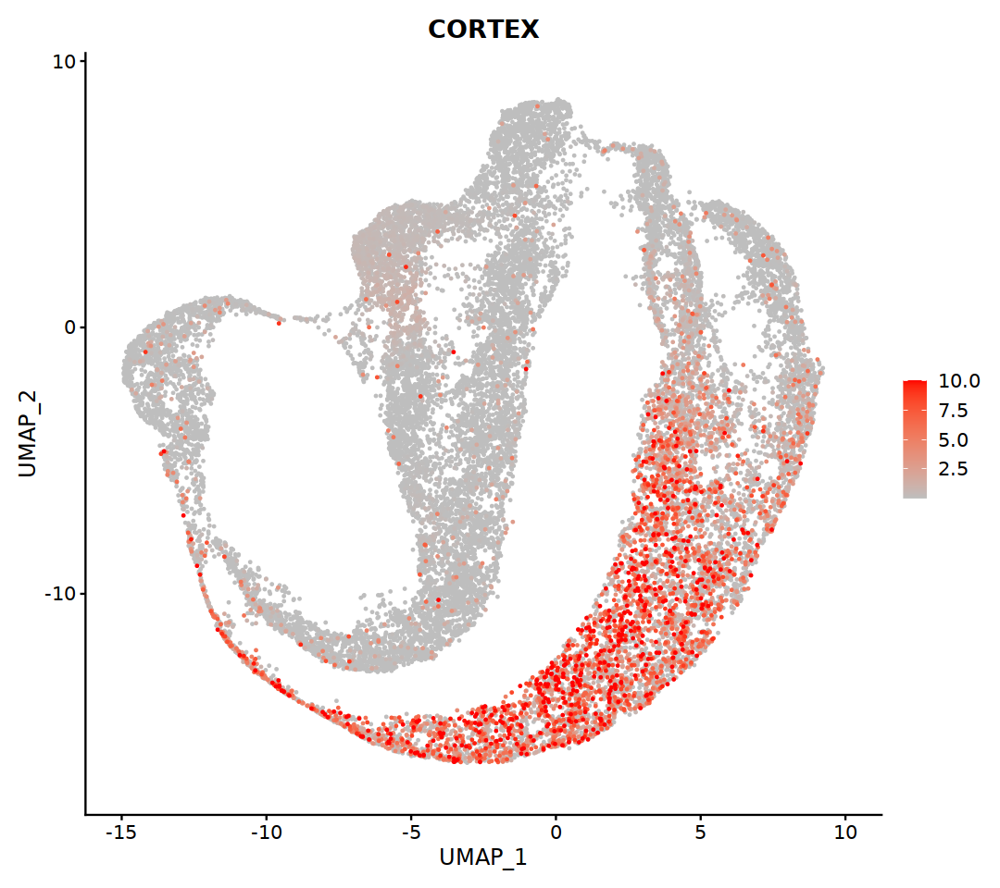

In [128]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT1G09750",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("CORTEX")

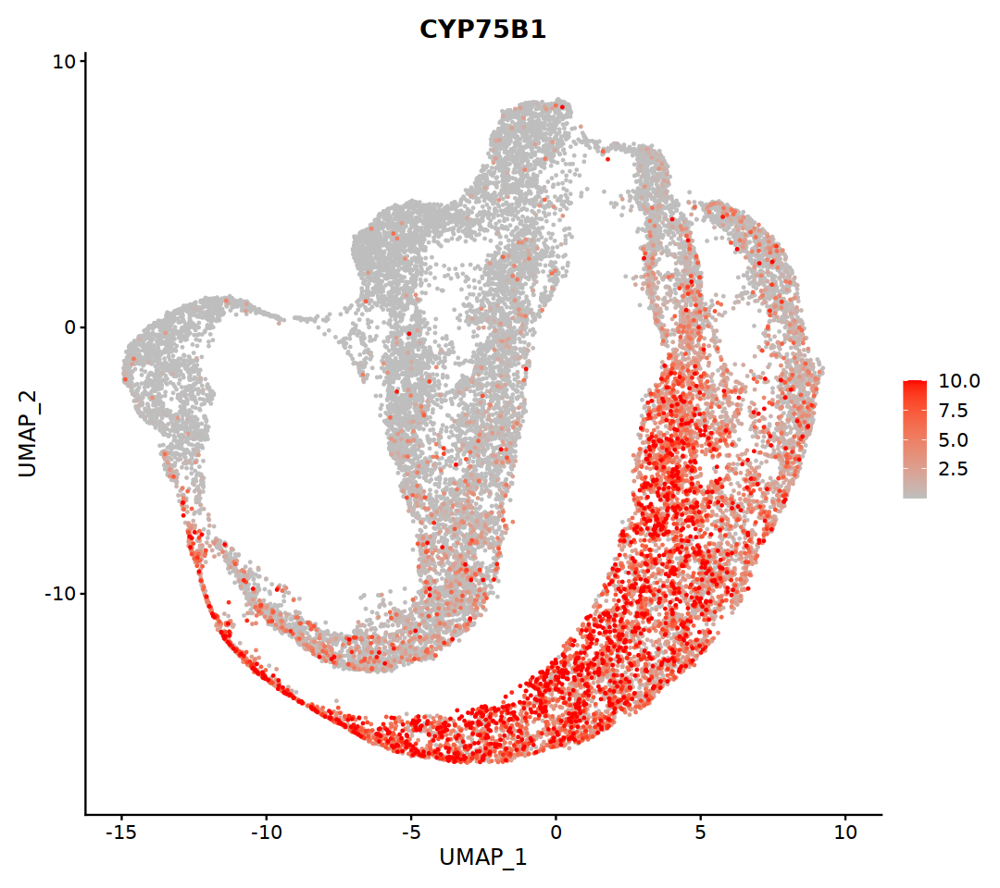

In [22]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT5G07990",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("CYP75B1")

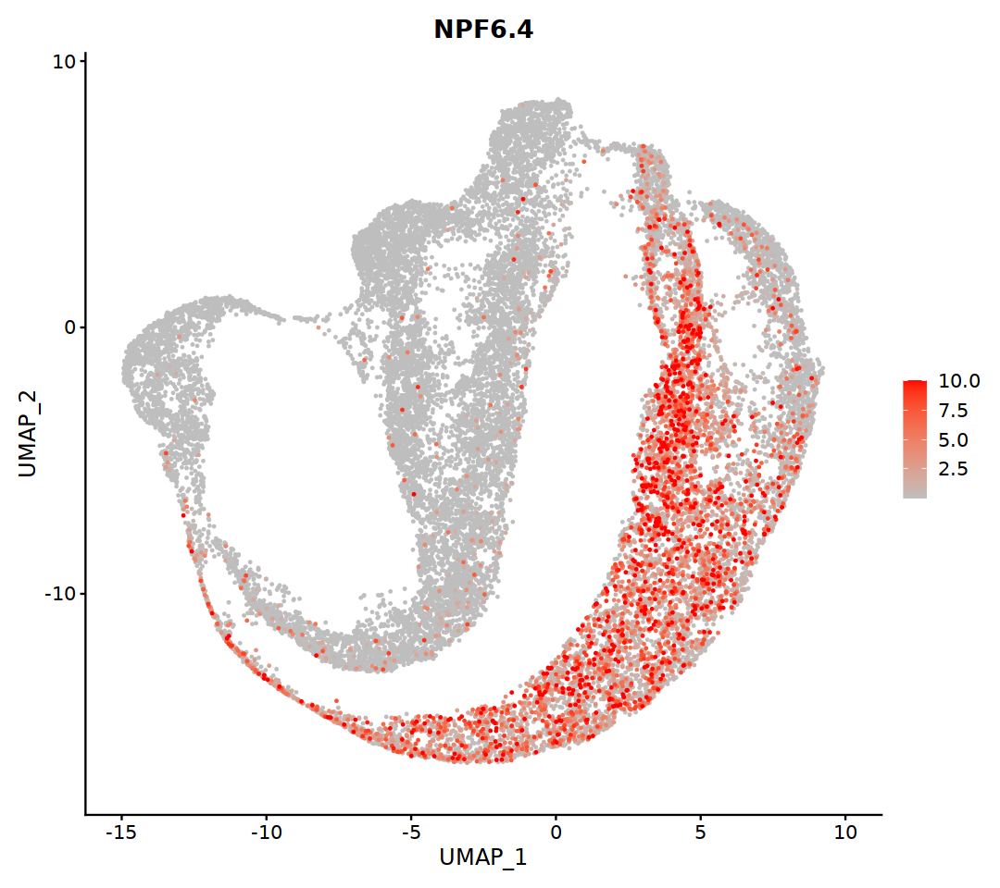

In [23]:
options(repr.plot.width=9, repr.plot.height=8)
DefaultAssay(rc.integrated) <- "integrated"

FeaturePlot(rc.integrated, features = "AT3G21670",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("NPF6.4")

In [24]:
# FindMarkers for celltype and time combination

rc.integrated$cell_group <- paste(rc.integrated$celltype.anno, rc.integrated$consensus.time.group, sep="_")

In [25]:
table(rc.integrated$cell_group)


          Cortex_T0           Cortex_T1           Cortex_T2           Cortex_T3 
                591                 329                 493                1216 
          Cortex_T4           Cortex_T5           Cortex_T6           Cortex_T7 
               1315                1442                1446                1282 
          Cortex_T8           Cortex_T9       Endodermis_T0       Endodermis_T1 
               1757                1202                 610                 398 
      Endodermis_T2       Endodermis_T3       Endodermis_T4       Endodermis_T5 
               1322                1624                1403                1132 
      Endodermis_T6       Endodermis_T7       Endodermis_T8       Endodermis_T9 
                905                 759                1266                1950 
Quiescent Center_T0 Quiescent Center_T1 
                 77                  81 

In [26]:
table(rc.integrated$celltype.anno, rc.integrated$consensus.time.group)

                  
                     T0   T1   T2   T3   T4   T5   T6   T7   T8   T9
  Quiescent Center   77   81    0    0    0    0    0    0    0    0
  Cortex            591  329  493 1216 1315 1442 1446 1282 1757 1202
  Endodermis        610  398 1322 1624 1403 1132  905  759 1266 1950

In [27]:
Idents(rc.integrated) <- "cell_group"

In [28]:
Clust_Markers <- FindAllMarkers(rc.integrated,
                                max.cells.per.ident = 5000,
                                only.pos=T, 
                               test.use="roc")

Calculating cluster Cortex_T4

Calculating cluster Cortex_T6

Calculating cluster Endodermis_T5

Calculating cluster Endodermis_T6

Calculating cluster Cortex_T9

Calculating cluster Endodermis_T1

Calculating cluster Cortex_T5

Calculating cluster Endodermis_T3

Calculating cluster Endodermis_T8

Calculating cluster Cortex_T7

Calculating cluster Endodermis_T7

Calculating cluster Endodermis_T4

Calculating cluster Cortex_T8

Calculating cluster Endodermis_T2

Calculating cluster Cortex_T0

Calculating cluster Endodermis_T9

Calculating cluster Cortex_T3

Calculating cluster Cortex_T1

Calculating cluster Quiescent Center_T1

Calculating cluster Quiescent Center_T0

Calculating cluster Endodermis_T0

Calculating cluster Cortex_T2



In [29]:
feature_names <- read_tsv("./supp_data/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()



── Column specification ───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  gene = col_character(),
  Name = col_character(),
  Type = col_character()
)




In [129]:
feature_names$Name[which(feature_names$gene == "AT1G09750")]="CORTEX"

In [130]:
Clust_Markers <- left_join(Clust_Markers, feature_names)

Joining, by = c("gene", "Name")



In [131]:
Clust_Markers %>% group_by(cluster) %>% tally()

cluster,n
<fct>,<int>
Cortex_T4,519
Cortex_T6,210
Endodermis_T5,271
Endodermis_T6,201
Cortex_T9,464
Endodermis_T1,1803
Cortex_T5,435
Endodermis_T3,483
Endodermis_T8,769


In [132]:
Clust_Markers %>% group_by(cluster) %>% top_n(1, myAUC)

myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.851,1.6098124,0.702,0.960,0.527,Endodermis_T7,Endodermis,T7,AT3G06125,AT3G06125,0.433,59,66,1,17,1.00000000,1.00000000
0.873,1.3599619,0.746,0.992,0.497,Endodermis_T6,Endodermis,T6,AT1G02900,RALF1,0.495,30,63,1,10,0.98787879,0.98787879
0.881,2.6551783,0.762,0.878,0.227,Cortex_T2,Cortex,T2,AT5G14020,AT5G14020,0.651,1,9,1,1,-0.97575758,0.97575758
0.933,2.2197096,0.866,0.976,0.181,Cortex_T8,Cortex,T8,AT5G15180,PER56,0.795,1,36,1,1,0.95151515,0.95151515
0.959,2.5184213,0.918,0.996,0.201,Cortex_T9,Cortex,T9,AT5G15180,PER56,0.795,2,95,1,13,0.95151515,0.95151515
0.851,1.5120091,0.702,0.916,0.240,Endodermis_T7,Endodermis,T7,AT5G66390,PER72,0.676,1,75,2,6,0.92727273,0.92727273
0.866,1.5772820,0.732,0.934,0.337,Cortex_T7,Cortex,T7,AT1G13930,AT1G13930,0.597,3,35,1,2,0.87878788,0.87878788
0.979,3.6306420,0.958,1.000,0.132,Endodermis_T0,Endodermis,T0,AT5G02450,RPL36C,0.868,140,28,1,6,-0.87878788,0.87878788
0.952,2.7290143,0.904,0.977,0.119,Endodermis_T1,Endodermis,T1,AT5G02960,RPS23B,0.858,4,448,3,107,-0.87878788,0.87878788


In [133]:
Clust_Markers <- separate(Clust_Markers, cluster, into=c("celltype", "stage"), sep="_", remove=F)

In [134]:
Clust_Markers <- mutate(Clust_Markers, pct.diff=pct.1-pct.2)

Clust_Markers <- arrange(Clust_Markers, desc(pct.diff)) %>%
group_by(cluster) %>%
mutate(pct.diff_rank=dplyr::row_number()) %>%
arrange(desc(avg_diff)) %>%
mutate(avg_diff_rank=dplyr::row_number()) %>%
arrange(desc(myAUC)) %>%
mutate(myAUC_rank=dplyr::row_number()) %>%
mutate(combined_rank_raw=(pct.diff_rank + avg_diff_rank + myAUC_rank)/3) %>%
arrange(combined_rank_raw) %>%
mutate(combined_rank=dplyr::row_number()) %>%
select(-combined_rank_raw) %>%
arrange(combined_rank)
Clust_Markers

myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.901,1.985825,0.802,0.959,0.287,Endodermis_T4,Endodermis,T4,AT5G13910,LEP,0.672,2,4,1,1,-0.357575758,0.357575758
0.915,2.138813,0.830,0.943,0.219,Endodermis_T3,Endodermis,T3,AT1G62480,AT1G62480,0.724,1,7,1,1,-0.612121212,0.612121212
0.881,2.655178,0.762,0.878,0.227,Cortex_T2,Cortex,T2,AT5G14020,AT5G14020,0.651,1,9,1,1,-0.975757576,0.975757576
0.993,5.784636,0.986,0.988,0.045,Quiescent Center_T1,Quiescent Center,T1,AT2G41800,AT2G41800,0.943,4,6,2,1,-0.200000000,0.200000000
0.880,1.977404,0.760,0.927,0.253,Cortex_T5,Cortex,T5,AT1G41830,SKS6,0.674,1,9,2,1,-0.175757576,0.175757576
0.867,1.663836,0.734,0.954,0.345,Cortex_T6,Cortex,T6,AT2G39010,PIP2-6,0.609,2,10,1,1,0.587878788,0.587878788
0.856,1.985059,0.712,0.940,0.330,Endodermis_T5,Endodermis,T5,AT2G16700,ADF5,0.610,7,8,7,1,-0.006060606,0.006060606
0.935,3.109681,0.870,0.953,0.189,Cortex_T9,Cortex,T9,AT5G44480,DUR,0.764,4,17,4,1,0.915151515,0.915151515
0.876,2.197686,0.752,0.910,0.311,Cortex_T3,Cortex,T3,AT5G62210,AT5G62210,0.599,7,15,3,1,-0.709090909,0.709090909


In [135]:
filter(Clust_Markers, celltype %in% c("Cortex", "Endodermis") & myAUC>=0.75) %>%
group_by(celltype) %>% 
tally()

celltype,n
<chr>,<int>
Cortex,4852
Endodermis,4925


In [136]:
filter(Clust_Markers, celltype %in% c("Cortex", "Endodermis") & myAUC>=0.75) %>%
group_by(cluster) %>% 
tally()

cluster,n
<fct>,<int>
Cortex_T4,253
Cortex_T6,86
Endodermis_T5,140
Endodermis_T6,81
Cortex_T9,270
Endodermis_T1,1205
Cortex_T5,214
Endodermis_T3,253
Endodermis_T8,380


In [137]:
table(Clust_Markers$stage)


  T0   T1   T2   T3   T4   T5   T6   T7   T8   T9 
7721 5523 1365 1091  844  706  411  465 1174 1300 

In [138]:
Clust_Markers$stage <- factor(Clust_Markers$stage, levels=c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"))

In [139]:
# write markers with AUC 0.75 and above to a csv
# "Cortex", "Endodermis"

Clust_Markers_to_write <- filter(Clust_Markers, celltype %in% c("Cortex", "Endodermis") & myAUC>=0.75) %>% arrange(celltype) %>% arrange(stage) %>% arrange(combined_rank)

write.csv(Clust_Markers_to_write, "./supp_data/WT_Endodermis_Cortex_markers_AUC_0.75.csv", row.names=F)

In [140]:
number_de_genes <- filter(Clust_Markers, celltype %in% c("Cortex", "Endodermis") & myAUC>=0.75) %>%
group_by(cluster) %>% 
tally() %>%
separate(cluster, into=c("celltype", "stage"), sep="_")

In [141]:
number_de_genes$stage <- factor(number_de_genes$stage, levels=c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"))

(number_de_genes <- arrange(number_de_genes, celltype) %>% arrange(stage) %>% rename("n_de_genes"=n))

write.csv(number_de_genes, "./supp_data/WT_Endodermis_Cortex_markers_AUC_0.75_n_DE.csv", row.names=F)

celltype,stage,n_de_genes
<chr>,<fct>,<int>
Cortex,T0,1961
Endodermis,T0,1759
Cortex,T1,1298
Endodermis,T1,1205
Cortex,T2,222
Endodermis,T2,399
Cortex,T3,275
Endodermis,T3,253
Cortex,T4,253


In [142]:
table(Clust_Markers$stage)


  T0   T1   T2   T3   T4   T5   T6   T7   T8   T9 
7721 5523 1365 1091  844  706  411  465 1174 1300 

In [143]:
Clust_Markers$stage <- factor(Clust_Markers$stage, levels=c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"))

In [144]:
rc.integrated$consensus.time.group <- factor(rc.integrated$consensus.time.group, levels=c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"))

In [145]:
Idents(rc.integrated) <- "consensus.time.group"

In [146]:
# pseudobulk of each stage

  afm <- as.matrix(rc.integrated@assays$integrated@data)
  pooled <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in unique(rc.integrated@meta.data$consensus.time.group)) {
    m <- afm[,which(rc.integrated@meta.data$consensus.time.group==i)]
    pooled <- cbind(pooled, rowSums(m)/ncol(m))
  }



In [147]:
unique(rc.integrated@meta.data$consensus.time.group)

[1] T4 T6 T5 T9 T1 T3 T8 T7 T2 T0
Levels: T0 T1 T2 T3 T4 T5 T6 T7 T8 T9

In [148]:
colnames(pooled) <- unique(rc.integrated@meta.data$consensus.time.group)

In [149]:
pooled_df <- as_tibble(pooled, rownames = "gene")

In [150]:
pooled_df_long <- pivot_longer(pooled_df, cols = 2:ncol(pooled_df), names_to = "stage", values_to = "expression")

In [151]:
long_order <- tibble(stage=paste("T", rep(0:9), sep=""), 
                     order=rep(1:10))

In [152]:
long_order

stage,order
<chr>,<int>
T0,1
T1,2
T2,3
T3,4
T4,5
T5,6
T6,7
T7,8
T8,9


In [153]:
(pooled_df_long <- left_join(pooled_df_long, long_order) %>%
arrange(order))

Joining, by = "stage"



gene,stage,expression,order
<chr>,<chr>,<dbl>,<int>
AT1G05260,T0,-0.9756156,1
AT3G59370,T0,-2.1390137,1
AT2G36100,T0,-0.5732628,1
AT1G12080,T0,-1.9192388,1
AT1G12090,T0,-0.8453402,1
AT4G11290,T0,-1.0448425,1
AT5G42180,T0,-0.6208027,1
AT5G66390,T0,-0.7698246,1
AT2G32300,T0,-1.1660403,1


In [154]:
(long_corrs <- pooled_df_long %>%
group_by(gene) %>%
summarise(long_cor = cor(order, expression, method = "spearman")))

`summarise()` ungrouping output (override with `.groups` argument)



gene,long_cor
<chr>,<dbl>
AT1G01010,0.72121212
AT1G01020,-0.33333333
AT1G01030,-0.26060606
AT1G01040,0.73333333
AT1G01050,-0.91515152
AT1G01070,0.20000000
AT1G01080,-0.04242424
AT1G01090,-0.87878788
AT1G01100,-0.91515152


In [155]:
Clust_Markers <- left_join(Clust_Markers, long_corrs) %>%
mutate(abs_long_cor=abs(long_cor)) %>%
arrange(-abs_long_cor)
Clust_Markers

Joining, by = c("gene", "long_cor")



myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.851,1.6098124,0.702,0.960,0.527,Endodermis_T7,Endodermis,T7,AT3G06125,AT3G06125,0.433,59,66,1,17,1,1
0.906,2.2766098,0.812,0.985,0.515,Endodermis_T8,Endodermis,T8,AT3G06125,AT3G06125,0.470,158,50,4,27,1,1
0.938,3.6469189,0.876,0.947,0.169,Endodermis_T1,Endodermis,T1,AT2G31610,RPS3A,0.778,124,29,119,36,-1,1
0.838,3.0433052,0.676,0.891,0.401,Cortex_T9,Cortex,T9,AT1G11910,APA1,0.490,117,20,77,45,1,1
0.890,4.6947655,0.780,0.900,0.340,Endodermis_T9,Endodermis,T9,AT5G19590,AT5G19590,0.560,164,8,72,47,1,1
0.932,4.8121159,0.864,0.971,0.507,Endodermis_T9,Endodermis,T9,AT5G55850,NOI,0.464,298,7,30,57,1,1
0.770,1.1769976,0.540,0.850,0.414,Endodermis_T6,Endodermis,T6,AT3G21240,4CL2,0.436,63,95,54,58,1,1
0.982,4.9356199,0.964,1.000,0.285,Quiescent Center_T1,Quiescent Center,T1,AT5G65700,BAM1,0.715,268,39,17,67,-1,1
0.891,4.2146378,0.782,0.927,0.468,Endodermis_T9,Endodermis,T9,AT3G61260,AT3G61260,0.459,303,23,70,72,1,1


In [156]:
genes_to_plt_df <- filter(Clust_Markers, celltype %in% c("Endodermis")) %>%
group_by(stage) %>%
top_n(20, -combined_rank) %>%
top_n(10, abs_long_cor) %>%
ungroup() %>%
arrange(stage)
# genes manually added to plotting list - these are known markers we want to make sure are there
to_add <- filter(Clust_Markers, celltype %in% c("Endodermis")) %>% filter(Name=="SCR" | Name=="MYB36" | Name=="CASP1")

(genes_to_plt_df <- bind_rows(genes_to_plt_df, to_add) %>% 
 ungroup() %>% 
 group_by(gene) %>%
 top_n(1, -combined_rank) %>% # order genes by stage of highest rank
 ungroup() %>% arrange(stage))

genes_to_plt <- unique(genes_to_plt_df$gene)

genes_to_plt_endo <- rev(genes_to_plt) # order to pointing upwards

myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.977,3.347157,0.954,0.997,0.116,Endodermis_T0,Endodermis,T0,AT3G60245,RPL37AC,0.881,85,84,3,7,-0.9151515,0.9151515
0.974,3.623934,0.948,0.997,0.126,Endodermis_T0,Endodermis,T0,AT4G31700,RPS6A,0.871,129,30,26,11,-0.9151515,0.9151515
0.975,3.270026,0.950,0.998,0.107,Endodermis_T0,Endodermis,T0,AT3G56340,RPS26C,0.891,50,104,19,8,-0.8909091,0.8909091
0.977,3.070570,0.954,1.000,0.097,Endodermis_T0,Endodermis,T0,AT5G27850,RPL18C,0.903,15,176,6,13,-0.8909091,0.8909091
0.977,3.254537,0.954,1.000,0.110,Endodermis_T0,Endodermis,T0,AT5G02960,RPS23B,0.890,52,108,4,5,-0.8787879,0.8787879
0.979,3.630642,0.958,1.000,0.132,Endodermis_T0,Endodermis,T0,AT5G02450,RPL36C,0.868,142,28,1,6,-0.8787879,0.8787879
0.975,3.364823,0.950,0.998,0.116,Endodermis_T0,Endodermis,T0,AT1G70600,RPL27AC,0.882,81,79,18,9,-0.8787879,0.8787879
0.971,3.621341,0.942,0.995,0.105,Endodermis_T0,Endodermis,T0,AT2G27530,RPL10AB,0.890,53,31,64,2,-0.8545455,0.8545455
0.977,3.224431,0.954,0.997,0.110,Endodermis_T0,Endodermis,T0,AT3G11510,RPS14B,0.887,64,125,5,12,-0.8303030,0.8303030


In [184]:
genes_to_plt_df <- filter(Clust_Markers, celltype %in% c("Cortex")) %>%
group_by(stage) %>%
top_n(20, -combined_rank) %>%
top_n(10, abs_long_cor) %>%
ungroup() %>%
arrange(stage)

# to add AT4G09760 AT5G02000

to_add <- filter(Clust_Markers, celltype %in% c("Cortex")) %>% filter(gene %in% c("AT1G09750","AT5G07990","AT3G21670","AT4G09760", "AT5G02000", "AT5G64620"))

(genes_to_plt_df <- bind_rows(genes_to_plt_df, to_add) %>% 
 ungroup() %>% 
 group_by(gene) %>%
 top_n(1, -combined_rank) %>%
 ungroup() %>% arrange(stage))



(genes_to_plt_df <- genes_to_plt_df %>% 
 ungroup() %>% 
 group_by(gene) %>%
 top_n(1, -combined_rank) %>%
 ungroup() %>% arrange(stage))

genes_to_plt <- unique(genes_to_plt_df$gene)

genes_to_plt_cortex <- genes_to_plt

myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.962,2.841572,0.924,0.988,0.117,Cortex_T0,Cortex,T0,AT5G28060,RPS24B,0.871,115,178,47,9,-0.8787879,0.8787879
0.967,2.712818,0.934,1.000,0.136,Cortex_T0,Cortex,T0,AT2G27720,AT2G27720,0.864,135,269,5,13,-0.8787879,0.8787879
0.964,2.682942,0.928,0.998,0.124,Cortex_T0,Cortex,T0,AT3G02080,RPS19A,0.874,102,302,19,14,-0.8303030,0.8303030
0.965,2.616760,0.930,0.997,0.106,Cortex_T0,Cortex,T0,AT5G16130,RPS7C,0.891,39,345,14,12,-0.7939394,0.7939394
0.970,2.844078,0.940,1.000,0.096,Cortex_T0,Cortex,T0,AT1G27400,RPL17A,0.904,12,175,1,4,-0.7818182,0.7818182
0.966,2.603655,0.932,1.000,0.096,Cortex_T0,Cortex,T0,AT5G45775,RPL11C,0.904,13,353,9,11,-0.7818182,0.7818182
0.967,2.697931,0.934,1.000,0.102,Cortex_T0,Cortex,T0,AT3G16080,RPL37C,0.898,25,284,6,7,-0.7090909,0.7090909
0.967,2.694637,0.934,0.998,0.093,Cortex_T0,Cortex,T0,AT3G45030,RPS20C,0.905,11,287,7,6,-0.6242424,0.6242424
0.965,2.575404,0.930,0.990,0.105,Cortex_T0,Cortex,T0,AT3G62530,AT3G62530,0.885,65,391,15,17,-0.5878788,0.5878788


myAUC,avg_diff,power,pct.1,pct.2,cluster,celltype,stage,gene,Name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank,long_cor,abs_long_cor
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<dbl>
0.962,2.841572,0.924,0.988,0.117,Cortex_T0,Cortex,T0,AT5G28060,RPS24B,0.871,115,178,47,9,-0.8787879,0.8787879
0.967,2.712818,0.934,1.000,0.136,Cortex_T0,Cortex,T0,AT2G27720,AT2G27720,0.864,135,269,5,13,-0.8787879,0.8787879
0.964,2.682942,0.928,0.998,0.124,Cortex_T0,Cortex,T0,AT3G02080,RPS19A,0.874,102,302,19,14,-0.8303030,0.8303030
0.965,2.616760,0.930,0.997,0.106,Cortex_T0,Cortex,T0,AT5G16130,RPS7C,0.891,39,345,14,12,-0.7939394,0.7939394
0.970,2.844078,0.940,1.000,0.096,Cortex_T0,Cortex,T0,AT1G27400,RPL17A,0.904,12,175,1,4,-0.7818182,0.7818182
0.966,2.603655,0.932,1.000,0.096,Cortex_T0,Cortex,T0,AT5G45775,RPL11C,0.904,13,353,9,11,-0.7818182,0.7818182
0.967,2.697931,0.934,1.000,0.102,Cortex_T0,Cortex,T0,AT3G16080,RPL37C,0.898,25,284,6,7,-0.7090909,0.7090909
0.967,2.694637,0.934,0.998,0.093,Cortex_T0,Cortex,T0,AT3G45030,RPS20C,0.905,11,287,7,6,-0.6242424,0.6242424
0.965,2.575404,0.930,0.990,0.105,Cortex_T0,Cortex,T0,AT3G62530,AT3G62530,0.885,65,391,15,17,-0.5878788,0.5878788


In [185]:
write.csv(genes_to_plt_endo, "./supp_data/consensus_time_endo_to_plot.csv", row.names=F)
write.csv(genes_to_plt_cortex, "./supp_data/consensus_time_cortex_to_plot.csv", row.names=F)

In [159]:
# subset for endodermis
Endo_QC  <- subset(rc.integrated, celltype.anno %in% c("Quiescent Center", "Endodermis"))

In [160]:
# pseudobulk of each stage of endodermis


  afm <- as.matrix(Endo_QC@assays$integrated@data)
  pooled_endo <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in unique(Endo_QC@meta.data$consensus.time.group)) {
    m <- afm[,which(Endo_QC@meta.data$consensus.time.group==i)]
    pooled_endo <- cbind(pooled_endo, rowSums(m)/ncol(m))
  }



In [161]:
colnames(pooled_endo) <- unique(Endo_QC@meta.data$consensus.time.group)

In [162]:
(endo_sub_m <- pooled_endo[genes_to_plt_endo, c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9")])

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9
AT2G15300,-0.14242723,-0.16149722,-2.809425e-01,-0.33057376,-0.31115196,-0.27073994,0.09957142,0.42311098,1.9529662,6.69348303
AT1G71740,-0.35660894,-0.38861004,-4.704698e-01,-0.45982226,-0.44527083,-0.44129964,-0.28372146,1.69033522,5.1668984,8.56355676
AT3G11550,-0.45387346,-0.47447793,-5.831723e-01,-0.57034652,-0.53650431,-0.49510965,-0.02590912,3.19715514,6.8916465,9.19329727
AT2G39430,-0.44548211,-0.40422254,-5.372530e-01,-0.51568935,-0.50679208,-0.49683335,-0.20074373,1.85296777,5.2198797,9.55926738
AT5G06200,-0.32523428,-0.41466255,-5.043669e-01,-0.46422293,-0.47391101,-0.43037394,-0.28721650,1.00965944,4.5592723,9.10937747
AT5G65020,-1.00819942,-0.69093475,-3.756301e-01,-0.30468028,-0.34045204,-0.14226229,0.31271816,1.29149919,2.0227179,3.89940521
AT2G28671,-0.35460516,-0.36516862,-3.968545e-01,-0.38767272,-0.32261326,0.03630028,0.85361903,3.40586000,5.8363485,8.06132472
AT1G44970,-0.28789572,-0.28097155,-3.083765e-01,-0.18732854,-0.15816977,-0.08031299,0.11728710,1.19911422,3.4993281,8.67665303
AT5G44790,-0.76083064,-0.81538100,-7.564502e-01,-0.69014925,-0.63201968,-0.47639592,-0.24766409,0.08388293,0.7781348,4.31773659
AT4G34050,-1.78984712,-1.90736562,-6.352310e-01,-0.14155373,0.25091423,0.90158277,1.93458694,1.12839587,0.9368397,8.30696836


In [163]:
# quantile normalize

mat = endo_sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

In [164]:
# side annotation with color to match umap

endo_sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#0000FF"),
        labels = c("Endodermis"), 
        labels_gp = gpar(col = "white", fontsize = 18)))

In [165]:
# genes to mark on side of heatmap

(endo_mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% c("XTH16", "SCR", "MYB36", "CASP1", "CASP2", "CASP3")))

Joining, by = "gene"



Name,index
<chr>,<int>
CASP2,3
CASP3,11
CASP1,12
MYB36,36
SCR,61
XTH16,63


In [166]:
# at - index of genes you want to mark
# labels - Names to show

endo_mark_anno = rowAnnotation(foo = anno_mark(at = endo_mat_for_mark$index, labels = endo_mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

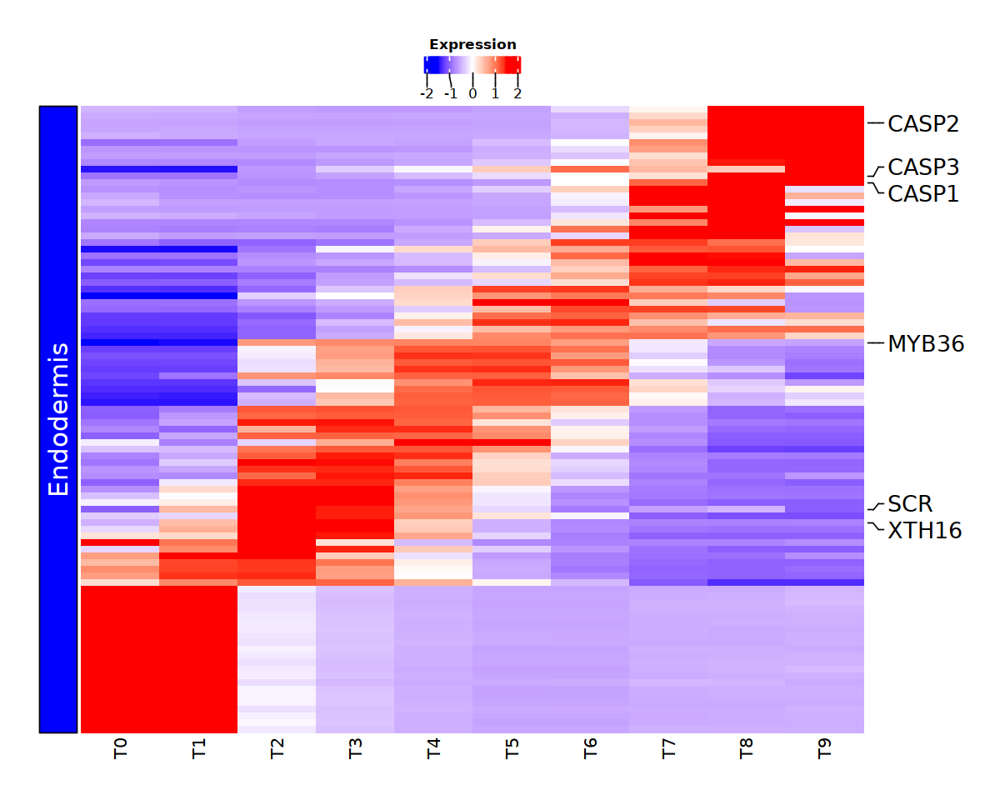

In [167]:
options(repr.plot.width=10, repr.plot.height=8)
Endo_hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                       c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
        cluster_rows=F,
                show_row_names = F, 
                   left_annotation=endo_sa,
                   right_annotation=endo_mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(Endo_hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")


In [186]:
# cortex subset
Cor_QC  <- subset(rc.integrated, celltype.anno %in% c("Quiescent Center", "Cortex"))

In [187]:
# pseudobulk of each stage of cortex


  afm <- as.matrix(Cor_QC@assays$integrated@data)
  pooled_cortex <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in unique(Cor_QC@meta.data$consensus.time.group)) {
    m <- afm[,which(Cor_QC@meta.data$consensus.time.group==i)]
    pooled_cortex <- cbind(pooled_cortex, rowSums(m)/ncol(m))
  }



In [188]:
colnames(pooled_cortex) <- unique(Cor_QC@meta.data$consensus.time.group)

In [189]:
(cor_sub_m <- pooled_cortex[genes_to_plt_cortex, c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9")])

,T0,T1,T2,T3,T4,T5,T6,T7,T8,T9
AT5G28060,3.3618492,2.6299378,-0.073066518,-0.8474143,-0.98969054,-1.1703605,-1.268575179,-1.31155911,-1.37317022,-1.40318396
AT2G27720,3.8613899,3.0233971,0.134892414,-0.5785870,-0.74875052,-0.8763586,-1.070331353,-1.12689923,-1.16017116,-1.20657080
AT3G02080,3.4246586,2.7404931,-0.059228205,-0.7242290,-0.82861098,-0.9228851,-1.013056434,-1.03356621,-1.04725742,-1.10604766
AT5G16130,7.8747834,5.6665560,-0.104457378,-1.3917178,-1.58696732,-1.7622831,-1.893205932,-1.86407705,-1.87133041,-1.90693716
AT1G27400,8.6212721,5.7445302,-0.393651039,-1.6408461,-1.82125725,-1.9811820,-2.067151010,-2.07150361,-2.10114890,-2.11542489
AT5G45775,7.5149917,5.1948935,-0.131228698,-1.3315355,-1.54532984,-1.6877456,-1.770982082,-1.75838575,-1.77343643,-1.80507639
AT3G16080,8.1424800,5.6297957,0.097099207,-1.4047155,-1.67514368,-1.8402602,-1.932430762,-1.89338502,-1.93443066,-1.95262379
AT3G45030,7.8812068,5.2848012,-0.604960919,-1.5217063,-1.62330267,-1.6821780,-1.734441332,-1.72134059,-1.74396387,-1.79158357
AT3G62530,6.6559972,5.0625430,-0.018679339,-0.9486519,-1.04881295,-1.1142400,-1.170516840,-1.14192258,-1.07853332,-1.06305724
AT3G13580,3.1904841,2.3151531,-0.244782986,-0.5234968,-0.58842122,-0.6335214,-0.690727363,-0.62127948,-0.64374928,-0.68322709


In [190]:
# annotation bar for consensus time

col_fun <- brewer.pal(10,"Spectral")

names(col_fun) <- c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9")
col_fun

ha = HeatmapAnnotation(`Consensus Time Group` = c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"), col = list(`Consensus Time Group` = col_fun), show_legend = F)

T0        T1        T2        T3        T4        T5        T6        T7 
"#9E0142" "#D53E4F" "#F46D43" "#FDAE61" "#FEE08B" "#E6F598" "#ABDDA4" "#66C2A5" 
       T8        T9 
"#3288BD" "#5E4FA2"

In [191]:
# quantile normalize

mat = cor_sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

In [192]:
# side annotation to match cortex colors

cortex_sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#82B6FF"),
        labels = c("Cortex"), 
        labels_gp = gpar(col = "black", fontsize = 18)))

In [193]:
feature_names %>% filter(gene == "AT1G09750")

gene,Name
<chr>,<chr>
AT1G09750,CORTEX


In [195]:
# genes to label on side of heatmap for cortex

(cor_mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% c("AT1G17285", "CYP75B1", "NPF6.4", "PER69", "AT4G09760")))

Joining, by = "gene"



Name,index
<chr>,<int>
AT1G17285,21
CYP75B1,45
NPF6.4,65
AT4G09760,81


In [176]:
# at - index of genes you want to mark
# labels - Names to show

cor_mark_anno = rowAnnotation(foo = anno_mark(at = cor_mat_for_mark$index, labels = cor_mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

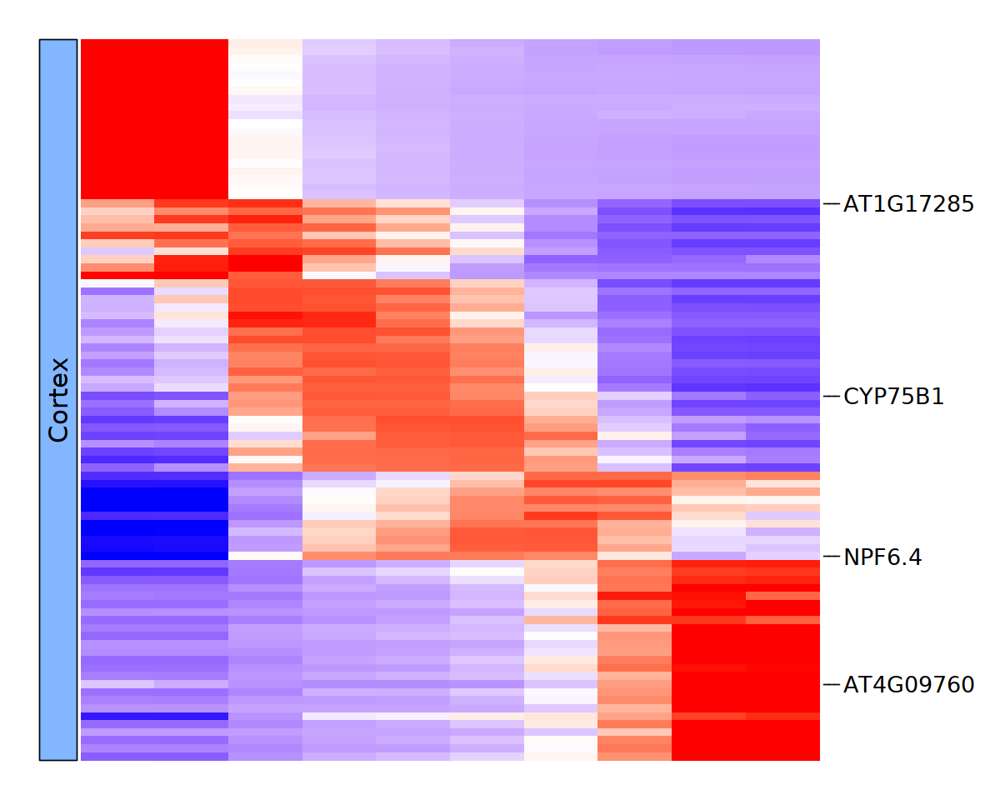

In [177]:
# ['#d8b365','#f5f5f5','#5ab4ac']
options(repr.plot.width=10, repr.plot.height=8)
Cortex_hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = F,
                cluster_columns = F,
        cluster_rows=F,
                show_row_names = F, 
        show_heatmap_legend = F, 
        left_annotation=cortex_sa, 
        right_annotation=cor_mark_anno)

draw(Cortex_hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")



In [178]:
# text annotation for consensus time

ht = columnAnnotation(foo = anno_text(c("T0", "T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9"), rot = 0, just = "center", gp = gpar(fontsize = 16)))

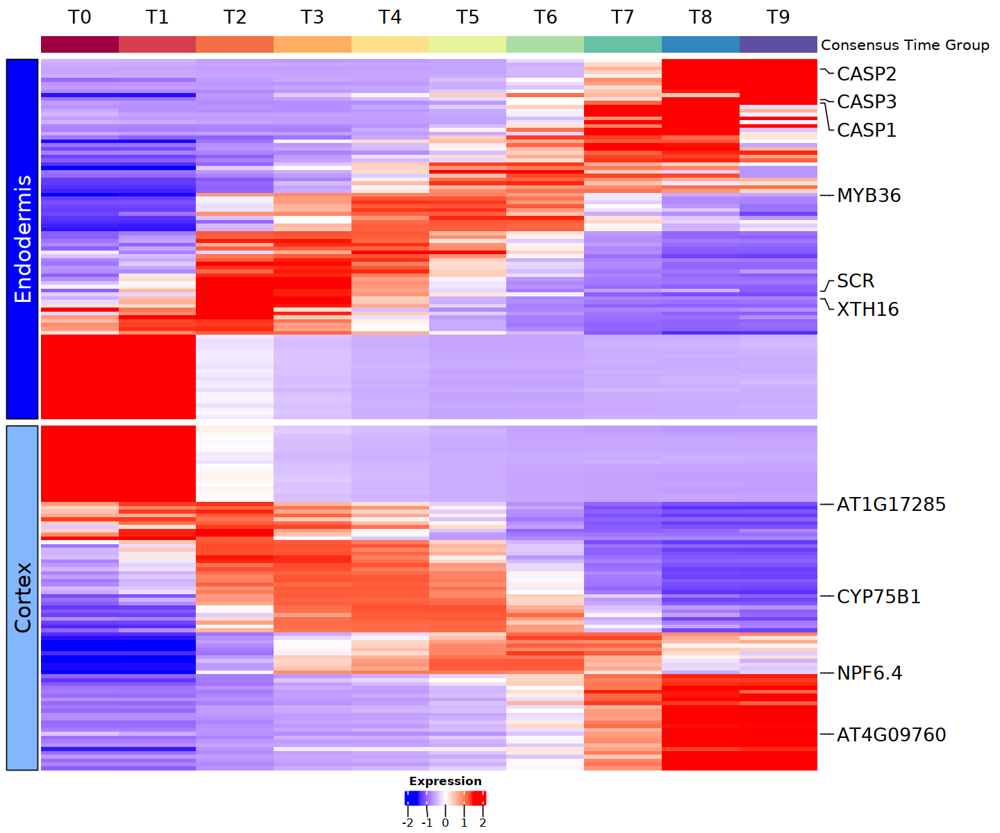

In [179]:
options(repr.plot.width=12, repr.plot.height=10)


ht_list = ht %v% ha %v% Endo_hm %v% Cortex_hm

draw(ht_list, ht_gap = unit(0.2, "cm"), padding = unit(c(2, 2, 5, 10), "mm"), heatmap_legend_side = "bottom")
# grab heatmap as a grob to arrange in cowplot
hm_final <- grid.grabExpr(draw(ht_list, ht_gap = unit(0.2, "cm"), padding = unit(c(2, 2, 5, 10), "mm"), heatmap_legend_side = "bottom"))## bottom, left, top and right



In [66]:
# output heatmap as pdf

pdf("./supp_data/WT_Ground_tissue_heatmap.pdf", width = 12, height = 10)
draw(ht_list, ht_gap = unit(0.2, "cm"), padding = unit(c(2, 2, 5, 10), "mm"), heatmap_legend_side = "bottom") ## bottom, left, top and right
dev.off()

png 
  2

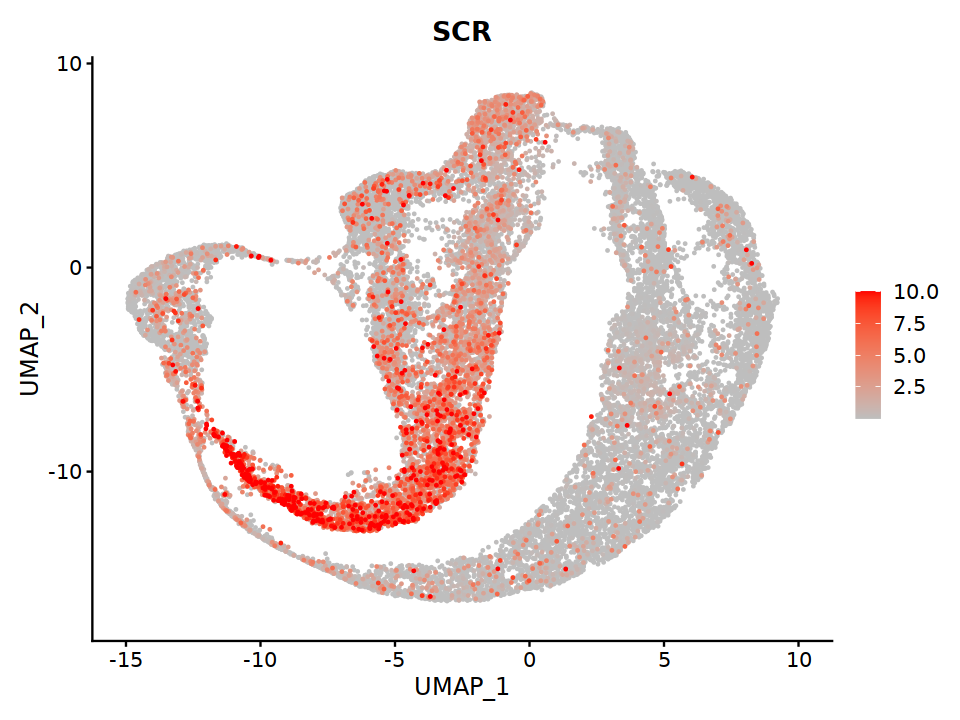

In [73]:
options(repr.plot.width=8, repr.plot.height=6)
DefaultAssay(rc.integrated) <- "integrated"


(SCR <- FeaturePlot(rc.integrated, features = "AT3G54220",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("SCR"))

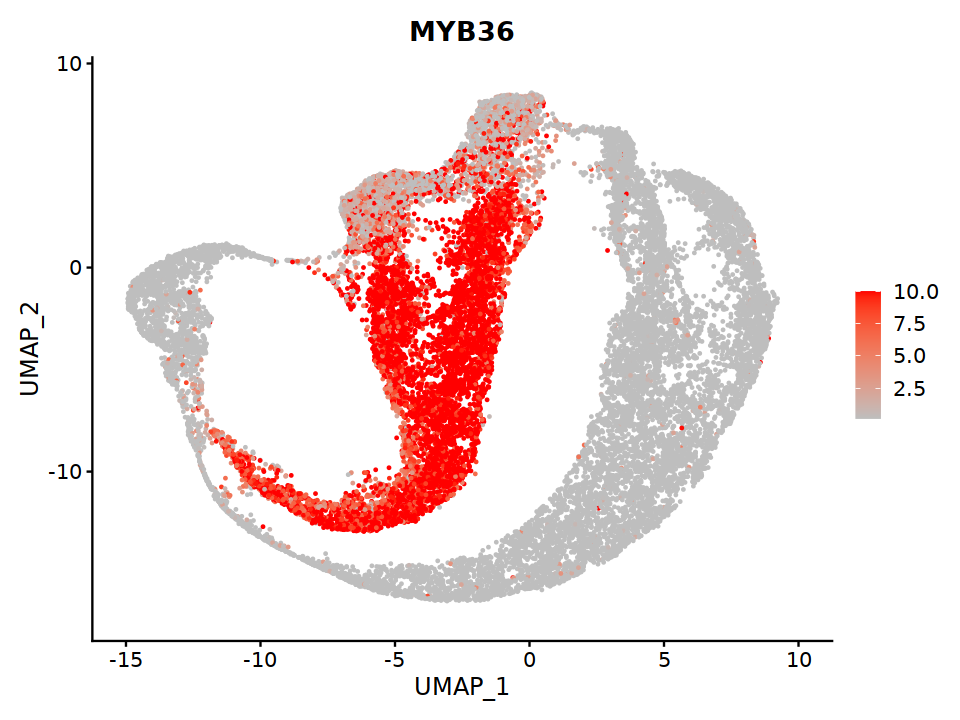

In [74]:
(MYB36 <- FeaturePlot(rc.integrated, features = "AT5G57620",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = F, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("MYB36"))


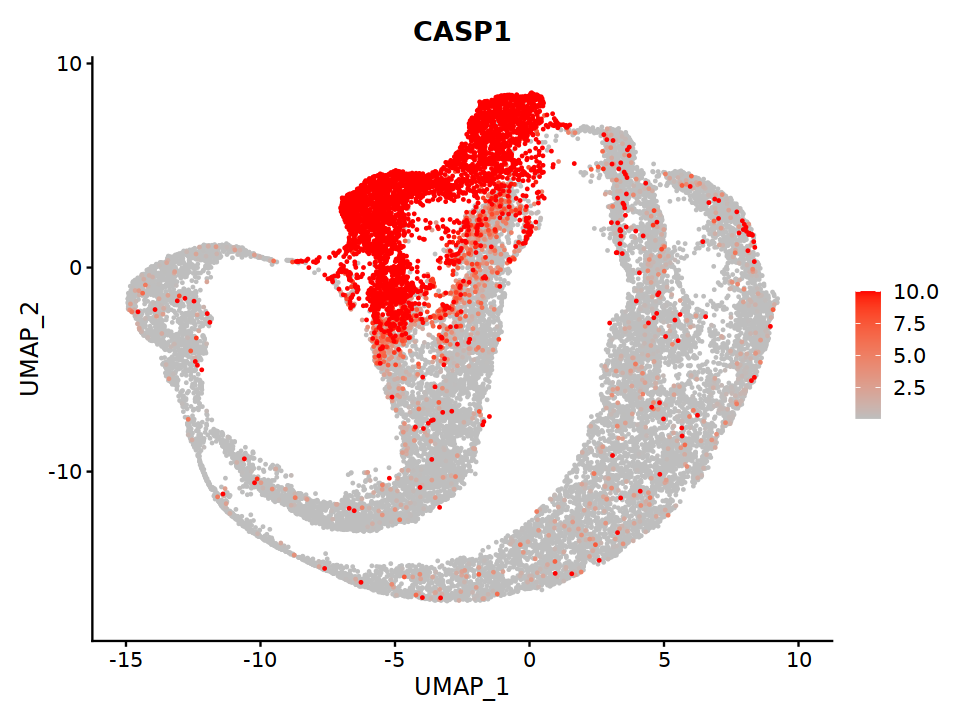

In [75]:
(CASP <- FeaturePlot(rc.integrated, features = "AT2G36100",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("CASP1"))




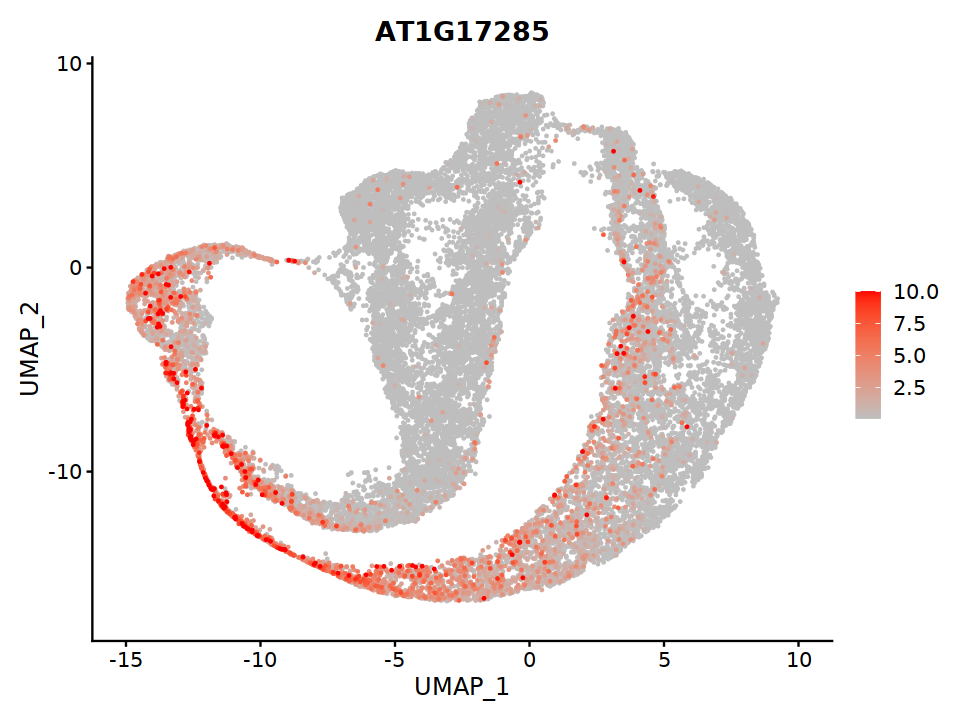

In [79]:
options(repr.plot.width=8, repr.plot.height=6)
(Cor_1 <- FeaturePlot(rc.integrated, features = "AT1G17285",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("AT1G17285"))


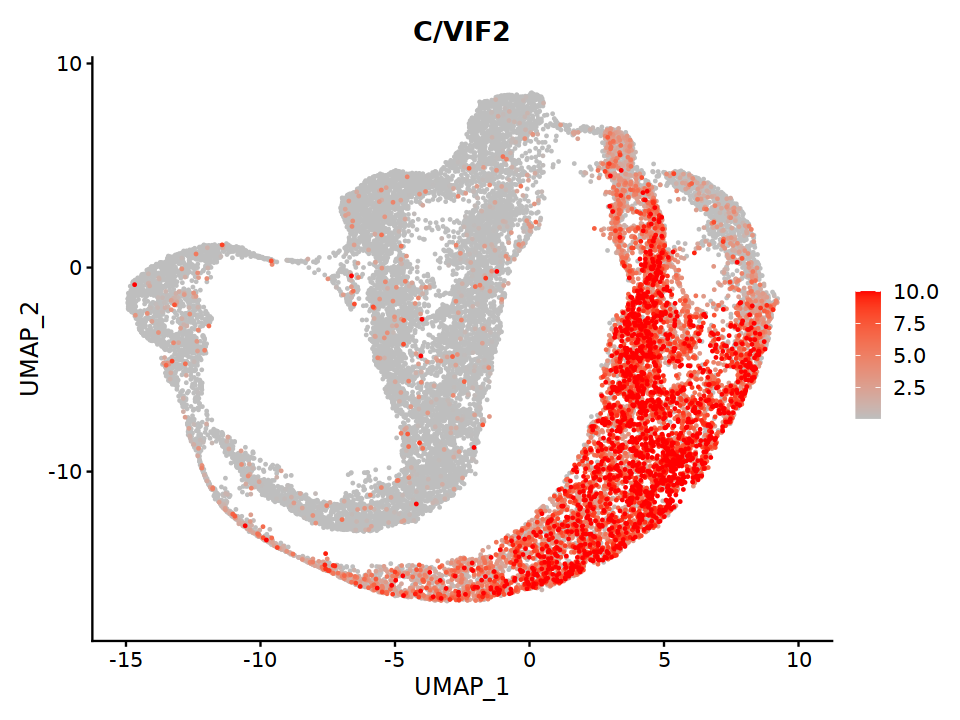

In [71]:
options(repr.plot.width=8, repr.plot.height=6)
(Cor_2 <- FeaturePlot(rc.integrated, features = "AT5G64620",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("C/VIF2"))


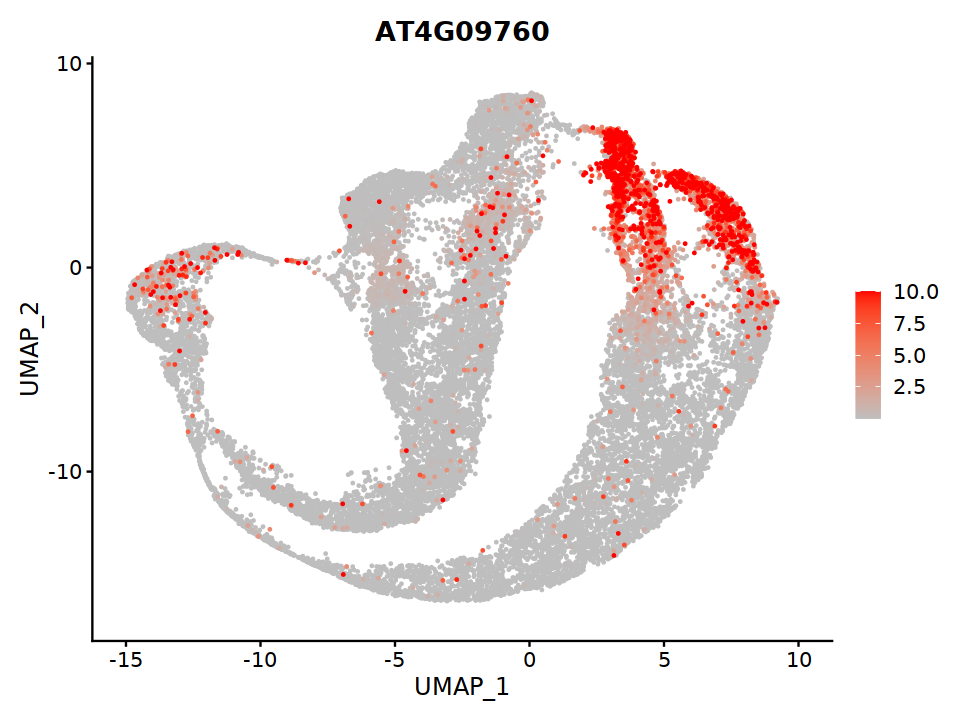

In [72]:
options(repr.plot.width=8, repr.plot.height=6)
(Cor_3 <- FeaturePlot(rc.integrated, features = "AT4G09760",
    cols = c("grey", "red"), label=F, repel=F, pt.size = 0.3, order = T, min.cutoff = "q1", max.cutoff = "q99") + ggtitle("AT4G09760"))


In [77]:
plot_anno <- function(rc.integrated){
order <- c("Quiescent Center", "Ground Tissue","Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Metaphloem & Companion Cell","Protophloem", "Xylem", "Procambium","Xylem Pole Pericycle","Phloem Pole Pericycle", "Protoxylem", "Metaxylem", "Unknown")
palette <- c("#9400d3", "#DCD0FF","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#dd77ec", "#9a6324", "#ffe119", "#ff9900", "#ffd4e3", "#9a6324", "#ddaa6f", "#EEEEEE")
rc.integrated$celltype.anno <- factor(rc.integrated$celltype.anno, levels = order[sort(match(unique(rc.integrated$celltype.anno),order))])
color <- palette[sort(match(unique(rc.integrated$celltype.anno),order))]
p1 <- DimPlot(rc.integrated, reduction = "umap", group.by = "celltype.anno", cols=color) + ggtitle("Cell Type") + theme(plot.title = element_text(hjust = 0.5))
p2 <- DimPlot(rc.integrated, reduction = "umap", group.by = "time.anno",order = c("Distal Columella","Proximal Columella","Distal Lateral Root Cap","Proximal Lateral Root Cap","Maturation","Elongation","Meristem"),cols = c("#e5f5e0", "#a1d99b", "#31a354", "#deebf7", "#3182bd", '#fee0d2','#de2d26')) + ggtitle("Developmental Stage") + theme(plot.title = element_text(hjust = 0.5))
p3 <- DimPlot(rc.integrated, reduction = "umap", group.by = "consensus.time.group", cols=brewer.pal(10,"Spectral")) + ggtitle("Consensus Time") + theme(plot.title = element_text(hjust = 0.5))
options(repr.plot.width=25, repr.plot.height=8)
gl <- lapply(list(p1, p2, p3), ggplotGrob)
gwidth <- do.call(unit.pmax, lapply(gl, "[[", "widths"))
gl <- lapply(gl, "[[<-", "widths", value = gwidth)
gridExtra::grid.arrange(grobs=gl, ncol=3)
}

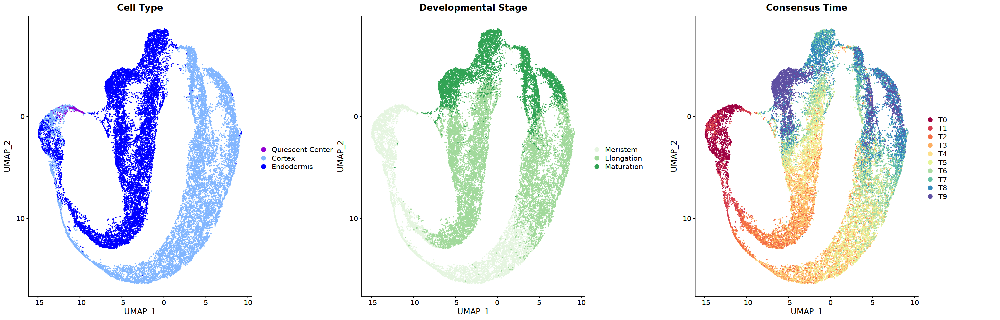

In [78]:
options(repr.plot.width=28, repr.plot.height=6)
top_umaps <- plot_anno(rc.integrated)

In [80]:
options(repr.plot.width=24, repr.plot.height=18)

gene_umaps <- plot_grid(SCR, MYB36, CASP, Cor_1, Cor_2, Cor_3, ncol=3, align="hv")

gene_hm <- plot_grid(gene_umaps, hm_final, ncol=2, rel_widths = c(1.6, 1))

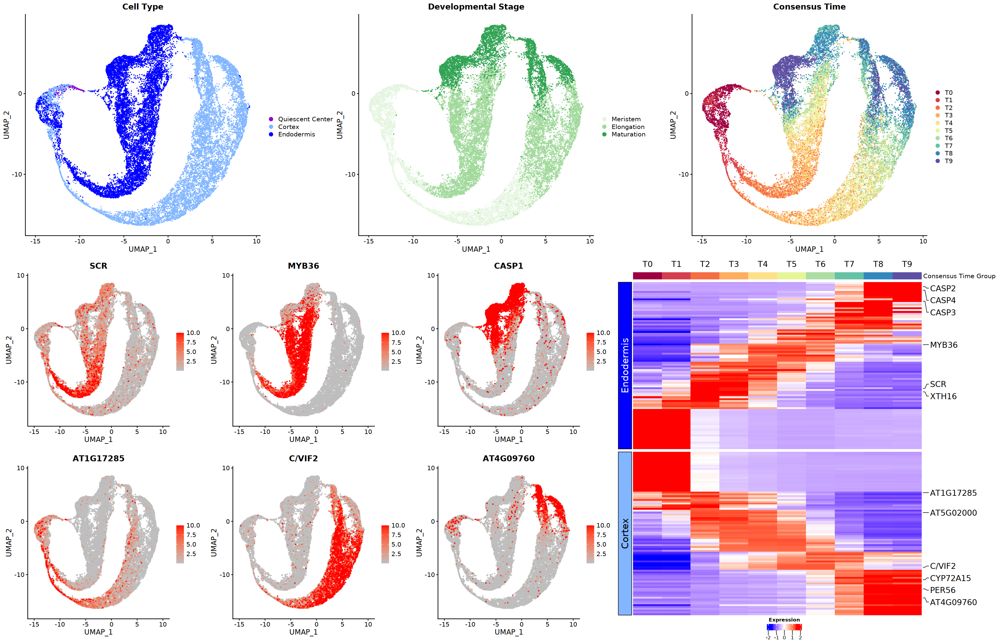

In [81]:
options(repr.plot.width=28, repr.plot.height=18)

plot_grid(top_umaps, gene_hm, ncol=1, rel_heights = c(1, 1.5))

In [82]:
ggsave("./supp_data/Endo_cortex_traj_combined.pdf",
  width = 28,
  height = 18)

In [83]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /fast/home/c/chsu/anaconda3/envs/seu3/lib/libopenblasp-r0.3.12.so

locale:
 [1] LC_CTYPE=en_US.utf-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.utf-8        LC_COLLATE=en_US.utf-8    
 [5] LC_MONETARY=en_US.utf-8    LC_MESSAGES=en_US.utf-8   
 [7] LC_PAPER=en_US.utf-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.utf-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ggrepel_0.8.2        circlize_0.4.12      ComplexHeatmap_2.6.2
 [4] cowplot_1.1.0        future_1.20.1        RColorBrewer_1.1-2  
 [7] Seurat_3.1.5         forcats_0.5.0        stringr_1.4.0       
[10] dplyr_1.0.2          purrr_0.3.4          readr_1.4.0         
[13] tidyr_1.